In [4]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import os
import PIL
from IPython.display import display

2025-10-30 10:54:18.477446: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1761821658.730777      37 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1761821658.803724      37 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [5]:
len(os.listdir('/kaggle/input/leaf-images/300_dataset/Apta'))

300

In [18]:
img=PIL.Image.open('/kaggle/input/leaf-images/300_dataset/Apta/1.jpg')
img.show()

Error: no "view" mailcap rules found for type "image/png"
/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening '/tmp/tmpkuj95zut.PNG'


Error: no "view" mailcap rules found for type "image/png"
/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening '/tmp/tmp8q4rqvbb.PNG'


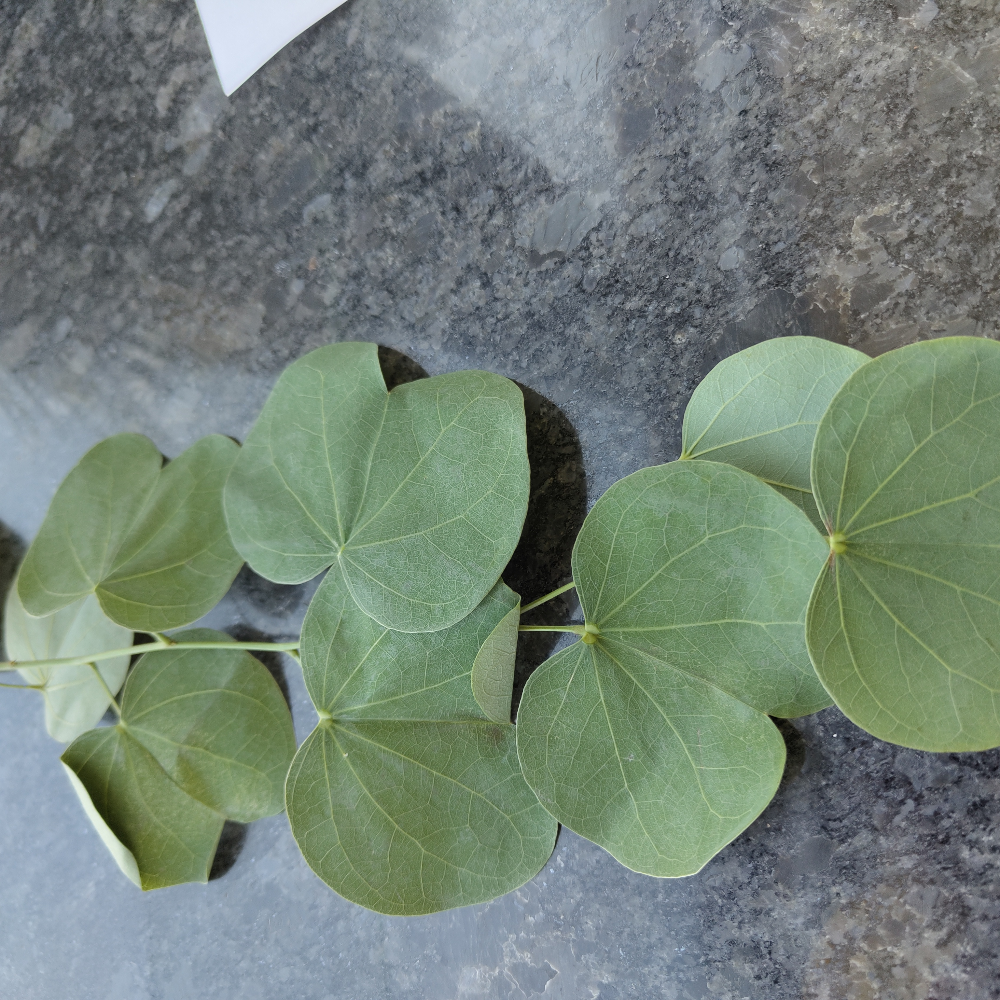

In [7]:
display(img)



In [ ]:
/kaggle/input/leaf-images/300_dataset/Vad/301.jpg

In [22]:
import os
from PIL import Image
import shutil

data_dir = '/kaggle/input/leaf-images/300_dataset'   # <-- change to your dataset path
output_dir = '/kaggle/working/cleaned_dataset'
os.makedirs(output_dir, exist_ok=True)

supported_formats = ['jpg', 'jpeg', 'png', 'bmp']

for subdir, dirs, files in os.walk(data_dir):
    for file in files:
        filepath = os.path.join(subdir, file)
        ext = file.split('.')[-1].lower()
        
        if ext not in supported_formats:
            print(f"Skipping unsupported format: {filepath}")
            continue

        try:
            with Image.open(filepath) as img:
                img.verify()  # verify file integrity
            # if passed, copy to working dir
            relative = os.path.relpath(subdir, data_dir)
            save_dir = os.path.join(output_dir, relative)
            os.makedirs(save_dir, exist_ok=True)
            shutil.copy(filepath, save_dir)
            print('camed')
        except Exception as e:
            print(f"⚠️ Corrupted or unreadable: {filepath} ({e})")


camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
camed
came

In [23]:
data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255,validation_split=0.1,)train_gen = data_gen.flow_from_directory(subset='training' , directory='/kaggle/working/cleaned_dataset', target_size=(150, 150), color_mode='rgb', class_mode='sparse', batch_size=32, shuffle=True, seed=None, save_to_dir=None, )test_gen = data_gen.flow_from_directory(subset='validation' , directory='/kaggle/working/cleaned_dataset', target_size=(150, 150), color_mode='rgb', class_mode='sparse', batch_size=32, shuffle=True, seed=None, save_to_dir=None, )model = keras.Sequential([
    keras.layers.Input(shape=(150,150,3)),

    keras.layers.Conv2D(64,(3,3),activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2,2)),

    keras.layers.Conv2D(128,(3,3),activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2,2)),

    keras.layers.Conv2D(256,(3,3),activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2,2)),

    keras.layers.Flatten(),
    keras.layers.Dense(512,activation='relu'),
    keras.layers.Dense(10,activation='softmax'),

    ])model.compile(optimizer='Adam',loss=keras.losses.SparseCategoricalCrossentropy(),metrics=['accuracy'])
model.fit(train_gen ,validation_data=test_gen,epochs=10)

In [24]:
train_gen = data_gen.flow_from_directory(subset='training' , directory='/kaggle/working/cleaned_dataset', target_size=(150, 150), color_mode='rgb', class_mode='sparse', batch_size=32, shuffle=True, seed=None, save_to_dir=None, )

Found 2700 images belonging to 10 classes.


In [25]:
test_gen = data_gen.flow_from_directory(subset='validation' , directory='/kaggle/working/cleaned_dataset', target_size=(150, 150), color_mode='rgb', class_mode='sparse', batch_size=32, shuffle=True, seed=None, save_to_dir=None, )

Found 300 images belonging to 10 classes.


In [26]:
test_gen.class_indices 

{'Apta': 0,
 'Indian Rubber Tree': 1,
 'Karanj': 2,
 'Kashid': 3,
 'Nilgiri': 4,
 'Pimpal': 5,
 'Sita Ashok': 6,
 'Sonmohar': 7,
 'Vad': 8,
 'Vilayati Chinch': 9}

In [27]:
model = keras.Sequential([
    keras.layers.Input(shape=(150,150,3)),

    keras.layers.Conv2D(64,(3,3),activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2,2)),

    keras.layers.Conv2D(128,(3,3),activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2,2)),

    keras.layers.Conv2D(256,(3,3),activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2,2)),

    keras.layers.Flatten(),
    keras.layers.Dense(512,activation='relu'),
    keras.layers.Dense(10,activation='softmax'),

    ])

In [28]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 148, 148, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 74, 74, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 72, 72, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 36, 36, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 34, 34, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 17, 17, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 73984)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │    37,880,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 38,256,266 (145.94 MB)

 Trainable params: 38,256,266 (145.94 MB)

 Non-trainable params: 0 (0.00 B)

In [29]:
model.compile(optimizer='Adam',loss=keras.losses.SparseCategoricalCrossentropy(),metrics=['accuracy'])
model.fit(train_gen ,validation_data=test_gen,epochs=10)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


I0000 00:00:1761822396.074443     159 service.cc:148] XLA service 0x7e6ba4006ed0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1761822396.077647     159 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1761822396.077671     159 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1761822396.477770     159 cuda_dnn.cc:529] Loaded cuDNN version 90300


 1/85 ━━━━━━━━━━━━━━━━━━━━ 10:52 8s/step - accuracy: 0.1667 - loss: 2.3206

I0000 00:00:1761822400.495188     159 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


85/85 ━━━━━━━━━━━━━━━━━━━━ 177s 2s/step - accuracy: 0.1434 - loss: 2.8178 - val_accuracy: 0.4000 - val_loss: 1.6646
Epoch 2/10
85/85 ━━━━━━━━━━━━━━━━━━━━ 164s 2s/step - accuracy: 0.4781 - loss: 1.5923 - val_accuracy: 0.5733 - val_loss: 1.3664
Epoch 3/10
85/85 ━━━━━━━━━━━━━━━━━━━━ 163s 2s/step - accuracy: 0.6229 - loss: 1.1703 - val_accuracy: 0.6633 - val_loss: 1.0780
Epoch 4/10
85/85 ━━━━━━━━━━━━━━━━━━━━ 163s 2s/step - accuracy: 0.7345 - loss: 0.8500 - val_accuracy: 0.7200 - val_loss: 0.9473
Epoch 5/10
85/85 ━━━━━━━━━━━━━━━━━━━━ 160s 2s/step - accuracy: 0.8414 - loss: 0.5017 - val_accuracy: 0.7367 - val_loss: 0.8839
Epoch 6/10
85/85 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.9041 - loss: 0.2873 - val_accuracy: 0.6967 - val_loss: 1.0029
Epoch 7/10
85/85 ━━━━━━━━━━━━━━━━━━━━ 164s 2s/step - accuracy: 0.9599 - loss: 0.1500 - val_accuracy: 0.7267 - val_loss: 1.0997
Epoch 8/10
85/85 ━━━━━━━━━━━━━━━━━━━━ 175s 2s/step - accuracy: 0.9168 - loss: 0.2747 - val_accuracy: 0.6833 - val_loss: 1.

In [34]:
import datetime


In [35]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
import datetime
import os

checkpoint_dir = '/kaggle/working/model_checkpoint'
os.makedirs(checkpoint_dir, exist_ok=True)

checkpoint_path = os.path.join(checkpoint_dir, 'weights.{epoch:02d}-{val_loss:.2f}.keras')


In [39]:

log_dir = '/kaggle/working/logs/fit/' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

model_chp = ModelCheckpoint(filepath=checkpoint_path,save_best_only=True,monitor='val_loss',mode='min',verbose=1)

In [40]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss',factor=0.2,patience=3,min_lr=0.0001)
earlyStopping = EarlyStopping(monitor='val_loss',patience=5,restore_best_weights=True)
callbacks= [model_chp,reduce_lr,earlyStopping]

In [41]:
model = keras.Sequential([
    keras.layers.Input(shape=(150,150,3)),

    keras.layers.Conv2D(64,(3,3),activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2,2)),

    keras.layers.Conv2D(128,(3,3),activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2,2)),

    keras.layers.Conv2D(256,(3,3),activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2,2)),

    keras.layers.Flatten(),
    keras.layers.Dense(512,activation='relu'),
    keras.layers.Dense(10,activation='softmax'),

    ])

In [42]:
model.compile(optimizer='Adam',loss=keras.losses.SparseCategoricalCrossentropy(),metrics=['accuracy'])
model.fit(train_gen ,validation_data=test_gen,epochs=50,callbacks=callbacks)

Epoch 1/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.1410 - loss: 2.8151
Epoch 1: val_loss improved from inf to 1.85050, saving model to /kaggle/working/model_checkpoint/weights.01-1.85.keras
85/85 ━━━━━━━━━━━━━━━━━━━━ 170s 2s/step - accuracy: 0.1418 - loss: 2.8087 - val_accuracy: 0.3000 - val_loss: 1.8505 - learning_rate: 0.0010
Epoch 2/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.4287 - loss: 1.6650
Epoch 2: val_loss improved from 1.85050 to 1.58794, saving model to /kaggle/working/model_checkpoint/weights.02-1.59.keras
85/85 ━━━━━━━━━━━━━━━━━━━━ 164s 2s/step - accuracy: 0.4292 - loss: 1.6642 - val_accuracy: 0.5033 - val_loss: 1.5879 - learning_rate: 0.0010
Epoch 3/50
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5870 - loss: 1.2837
Epoch 3: val_loss improved from 1.58794 to 1.13579, saving model to /kaggle/working/model_checkpoint/weights.03-1.14.keras
85/85 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.5872 - loss: 1.2828 - val_accuracy: 0.6433 - val_los